# Advanced Lane Finding

### IPython Configurations

In [32]:
import matplotlib as mpl
%matplotlib inline

mpl.rcParams['grid.linestyle'] = ''
mpl.rcParams['figure.figsize'] = [8.0, 6.0]
mpl.rcParams['figure.max_open_warning'] = False

### Helper Functions

In [33]:
import numpy as np
import matplotlib.pyplot as plt

def plot2(img1, title1, img2, title2):
    plt.figure()
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    f.tight_layout()
    ax1.imshow(img1, cmap='gray' if len(img1.shape) == 2 else 'brg')
    ax1.set_title(title1)
    ax2.imshow(img2, cmap='gray' if len(img2.shape) == 2 else 'brg')
    ax2.set_title(title2)
    return f, (ax1, ax2)

## 1. Undistortion

In [34]:
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Read in the saved objpoints and imgpoints
dist_pickle = pickle.load(open("dist_pickle.p", "rb"))
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]

# Performs image distortion correction and returns the undistorted image
def undistort(img):
    global mtx, dist
    return cv2.undistort(img, mtx, dist, None, mtx)

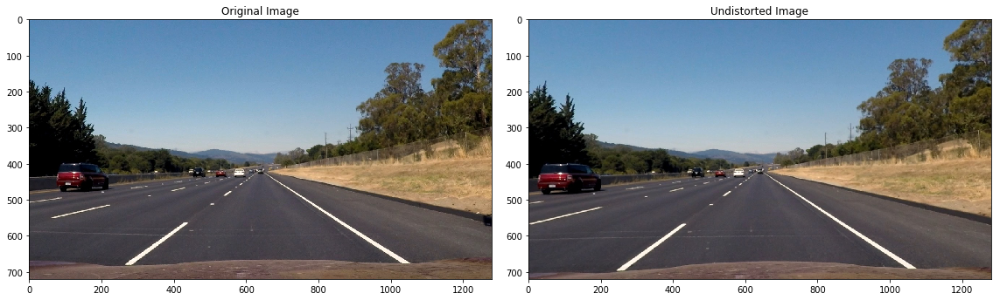

In [35]:
# Read in a test image
img = mpimg.imread('test_images/straight_lines2.jpg')
undistorted = undistort(img)

plot2(img, 'Original Image', undistorted, 'Undistorted Image')
plt.savefig('output_images/straight_lines2_undist.png')

## 2. Thresholding

In [36]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

#HYPERPARAMETERS
s_thresh = (170, 255)
sx_thresh = (20, 100)

def morph_operation(binary_img):
    kernel = np.ones((3,3), np.uint8)
    binary_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)
    binary_img = cv2.morphologyEx(binary_img, cv2.MORPH_OPEN, kernel)
    return binary_img

# Applies combined thresholding (i.e. gradient and color thresholding) to find lines
# and returns binary image the result of thresholding
def threshold(img, debug=False):
    global s_thresh, sx_thresh
    
    # Convert to HLS color space and separate L and S channels
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1
    
    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1
    
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1)] = 1
    
    # Test morphological operations
    combined_binary = morph_operation(combined_binary)
    
    if debug:
        # Stack each channel
        color_binary = np.dstack(( np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
        
        # Plot the result
        plt.figure()
        f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(16, 6))
        f.tight_layout()
        ax1.imshow(img)
        ax1.set_title('Original Image')
        ax2.imshow(color_binary)
        ax2.set_title('Pipeline Result')
        ax3.imshow(combined_binary, cmap='gray')
        ax3.set_title('Combined Binary')
    
    return combined_binary

In [37]:
def abs_sobel_thresh(abs_sobel, thresh=(0, 255)):
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    # Return the result
    return binary_output

def mag_thresh(sobelx, sobely, mag_thresh=(0, 255)):
    # Calculate the gradient magnitude
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    scale_factor = np.max(gradmag)/255 
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    return binary_output

def dir_threshold(abs_sobelx, abs_sobely, thresh=(0, np.pi/2)):
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    binary_output = np.zeros_like(grad_dir).astype(np.uint8)
    binary_output[(grad_dir > thresh[0]) & (grad_dir < thresh[1])] = 1
    return binary_output

def value_threshold(channel, thresh=(0, 255)):
    binary_output = np.zeros_like(channel)
    binary_output[(channel > thresh[0]) & (channel <= thresh[1])] = 1
    return binary_output

def threshold2(img, ksize, debug=False):
    luv = cv2.cvtColor(img, cv2.COLOR_RGB2Luv)
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    v_channel = luv[:,:,0]
    b_channel = lab[:,:,2]
    
    gray = cv2.addWeighted(v_channel, 0.5, b_channel, 0.5, 0)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=ksize)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=ksize)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)

    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(abs_sobelx, thresh=(15, 150))
    grady = abs_sobel_thresh(abs_sobely, thresh=(15, 150))
    mag_binary = mag_thresh(sobelx, sobely, mag_thresh=(25, 255))
    dir_binary = dir_threshold(abs_sobelx, abs_sobely, thresh=(0.7, 1.3))
    
    white_binary = value_threshold(v_channel, (185, 255))
    yellow_binary = value_threshold(b_channel, (145, 200))
    
    if debug:
        plot2(gradx, 'X', grady, 'Y')
        plot2(mag_binary, 'Mag', dir_binary, 'Dir')
        plot2((gradx == 1) & (grady == 1), 'X & Y', mag_binary & dir_binary, 'Mag & Dir')
        plot2(yellow_binary, 'Yellow', white_binary, 'White')

    combined = np.zeros_like(dir_binary)
    combined[(((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))) & ((white_binary == 1) | (yellow_binary == 1))] = 1
    
    #combined = morph_operation(combined)
    
    return combined

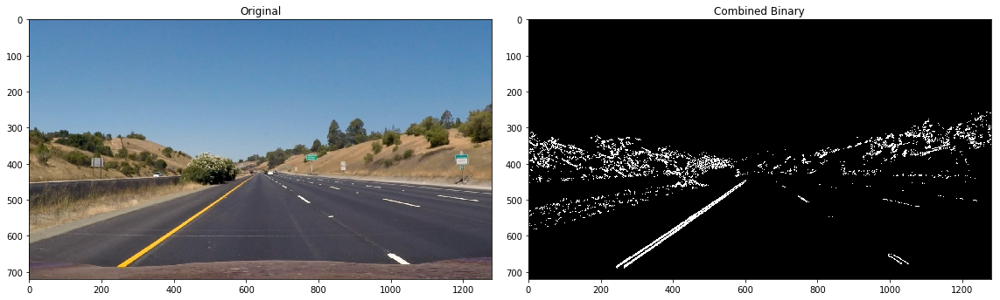

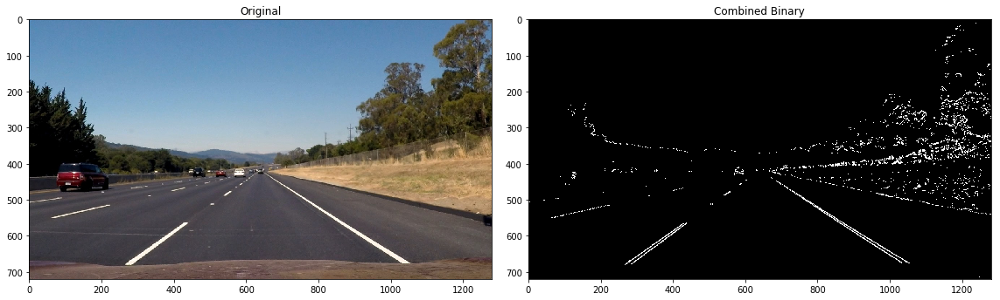

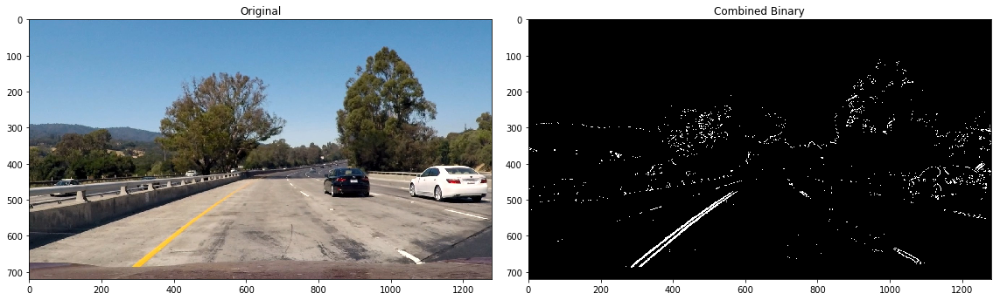

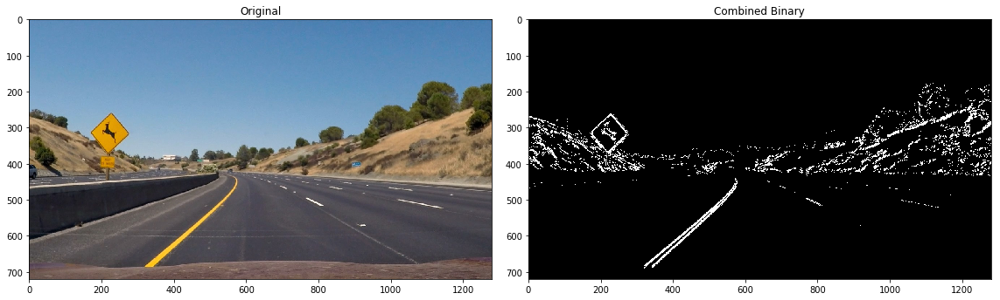

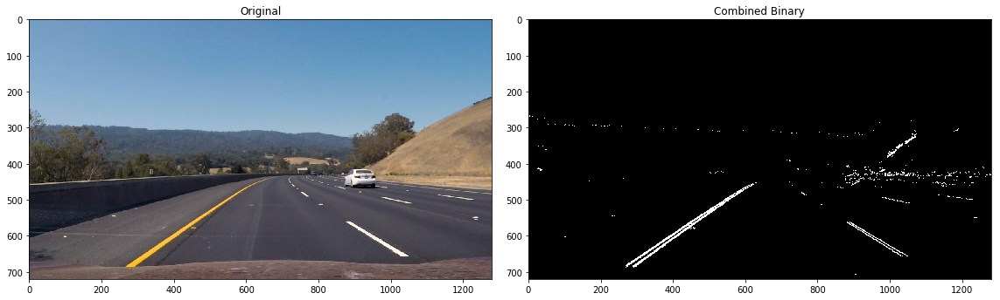

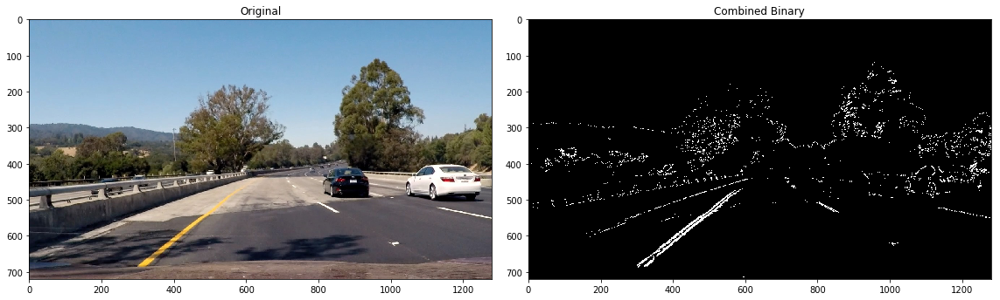

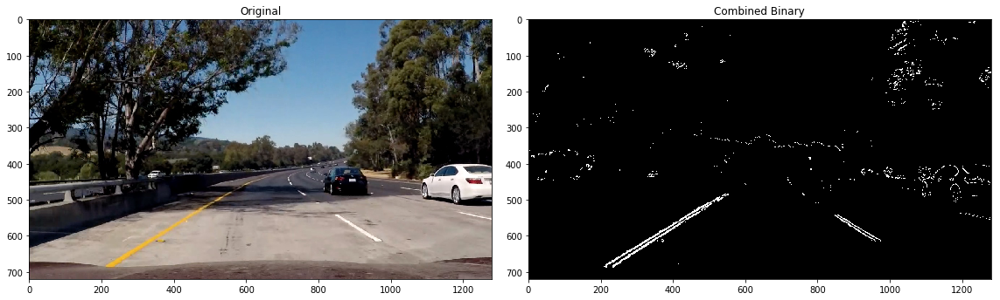

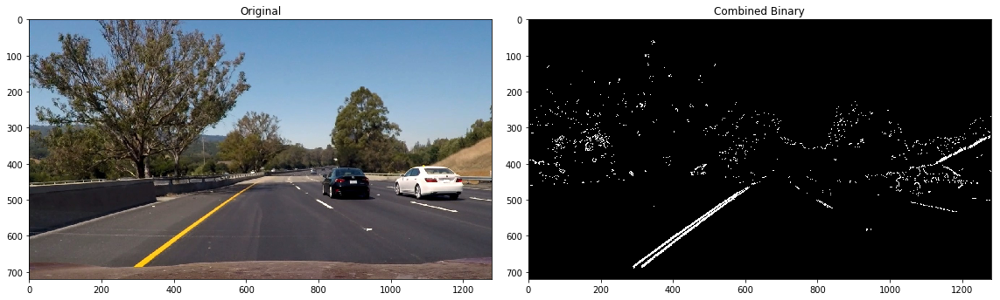

In [38]:
test_images = glob.glob('test_images/*.jpg')
#test_images = glob.glob('test_images/video2/*.png')
for fname in sorted(test_images):
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    #thresholded = threshold(img, debug=True)
    thresholded = threshold2(img, 9, debug=False)
    plot2(img, 'Original', thresholded, 'Combined Binary')
    img_name = fname.split('/')[-1].split('.')[0]
    plt.savefig('output_images/' + img_name + '_thresholded.png')

## 3. Perspective Transform

In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

def calculateTransformMatrix(src, dst):
    # calculate M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # calculate inverse M
    Minv = cv2.getPerspectiveTransform(dst, src)
    return M, Minv
    
def warp(img, M):
    # calculate image size
    # if image shape has 3 items, it must be a color image
    img_size = img.shape[::-1] if len(img.shape) == 2 else img.shape[1::-1]
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    return warped

src = np.float32([[576, 460],
                  [708, 460],
                  [1120, 720],
                  [207, 720]])
dst = np.float32([[320, 0],
                  [960, 0], 
                  [960, 720], 
                  [320, 720]])
M, Minv = calculateTransformMatrix(src, dst)

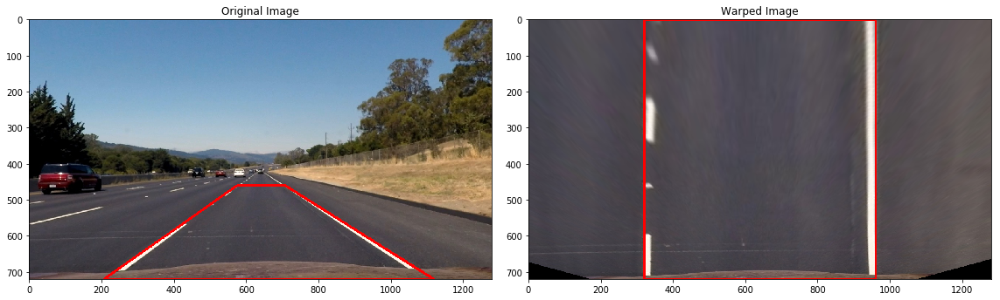

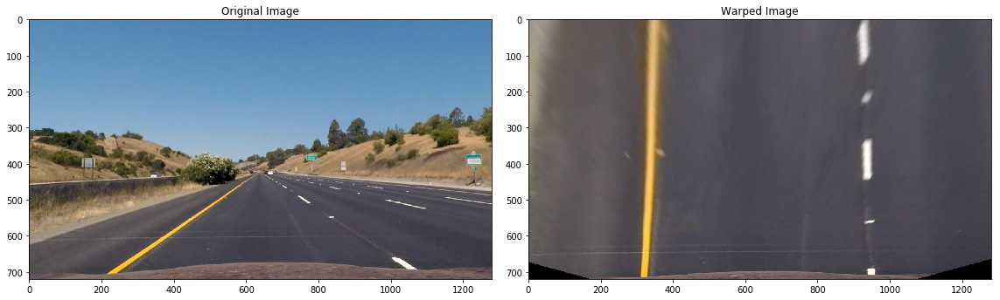

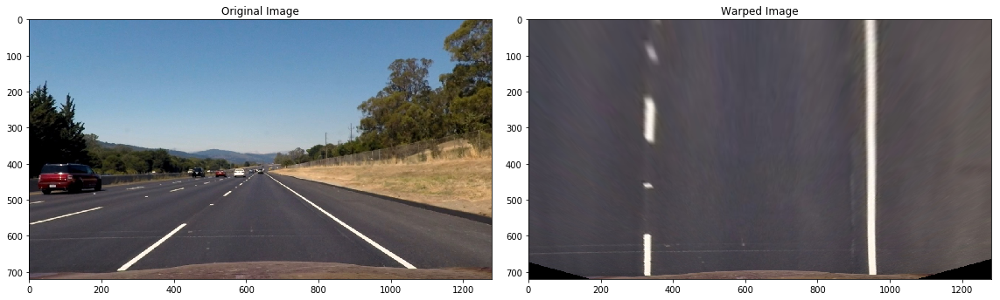

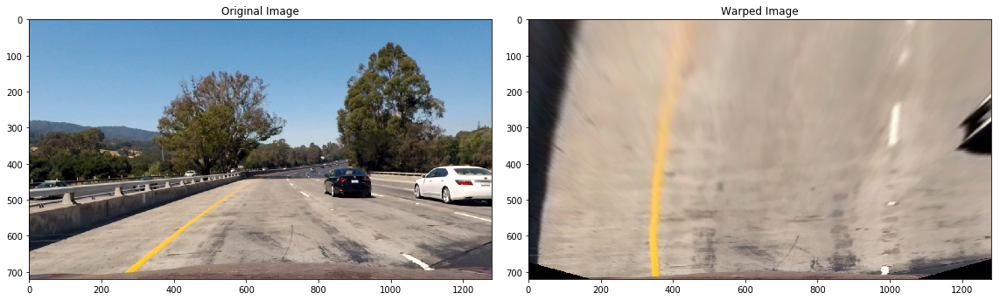

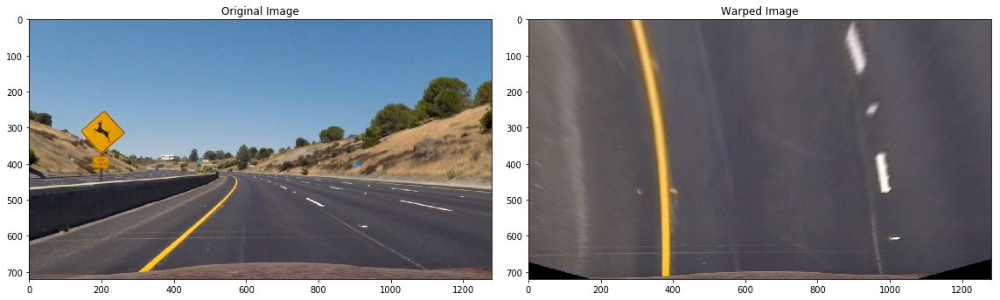

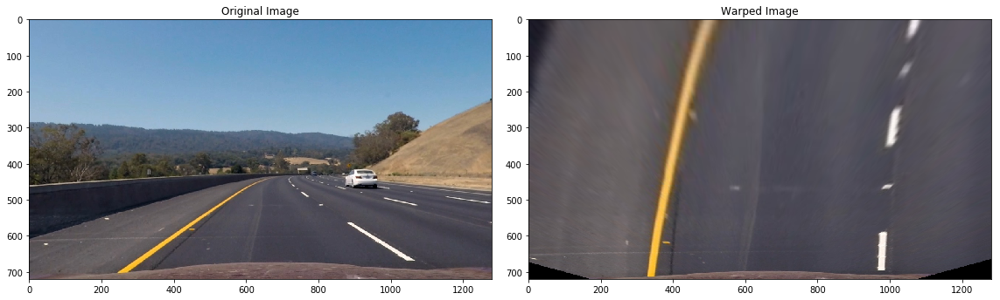

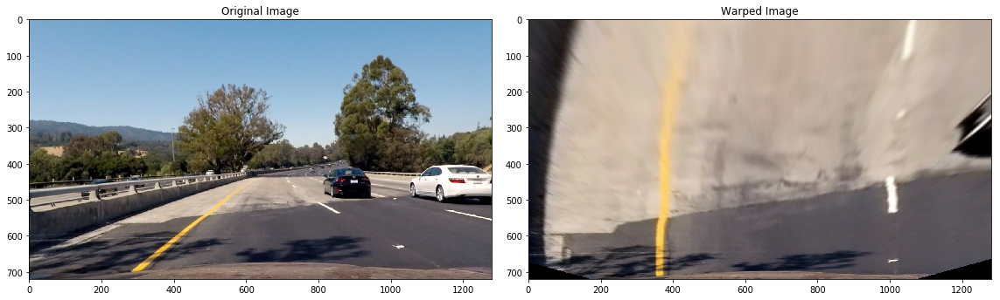

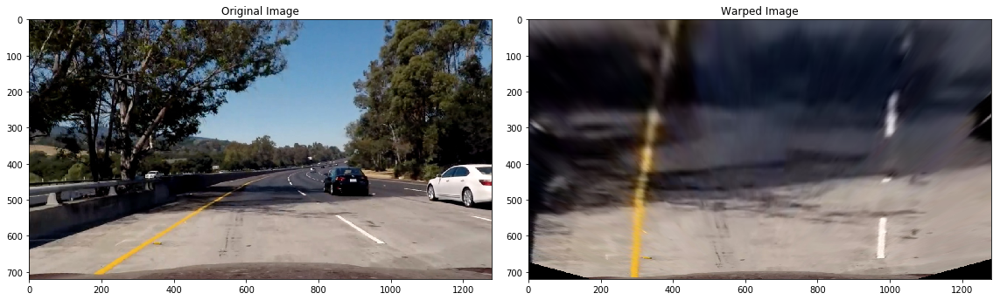

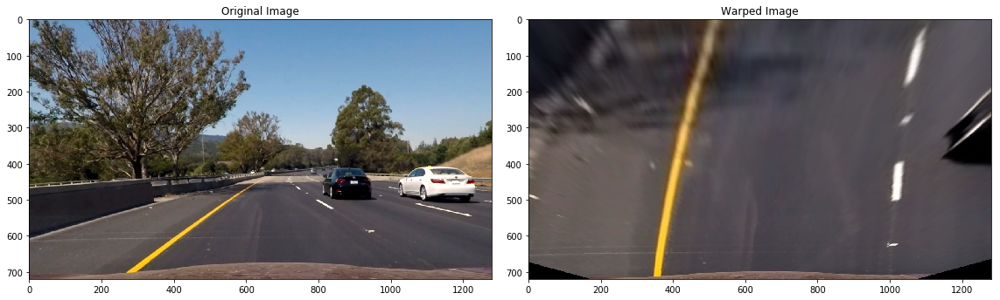

In [40]:
# To illustrate the source and destination points, draw them
# onto the test image where the points were selected on.
img = mpimg.imread('test_images/straight_lines2.jpg')
undistorted = undistort(img)
warped = warp(undistorted, M)
# Draw source and destination points
cv2.polylines(undistorted, [np.int32(src.reshape(-1, 1, 2))], True, (255, 0, 0), 5)
cv2.polylines(warped, [np.int32(dst.reshape(-1, 1, 2))], True, (255, 0, 0), 5)
plot2(undistorted, 'Original Image', warped, 'Warped Image')
plt.savefig('output_images/straight_lines2_warped.png')

test_images = glob.glob('test_images/*.jpg')
#test_images = glob.glob('test_images/video/*.png')
for fname in sorted(test_images):
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undistorted = undistort(img)
    warped = warp(undistorted, M)
    plot2(undistorted, 'Original Image', warped, 'Warped Image')

## 4. Finding the Lines

In [41]:
import numpy as np

# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self, last_line=None):
        # was the line detected in the last iteration?
        self.detected = False
        #average x values of the fitted line over the last n iterations
        self.bestx = last_line.bestx if last_line is not None else None
        #polynomial function averaged over the last n iterations
        self.bestp = last_line.bestp if last_line is not None else None
        #polynomial function for the most recent fit
        self.currentp = None
        #x values for the most recent fit
        self.currentx = None
        #radius of curvature of the line in some units
        self.radius_of_curvature = None
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        # slope at y = image_height
        self.slope = None
        #x values for detected line pixels
        self.allx = None
        #y values for detected line pixels
        self.ally = None
        #searched windows
        # this is just for visualization
        self.windows = None
        #last search area
        # this is also for visualization
        self.area = None
        #count of frames where line is not found in a row
        self.nlost_frames = 0

In [42]:
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2

# HYPERPARAMETERS
# Choose the number of sliding windows
nwindows = 9
# Set the width of the windows +/- margin
margin = 100
# Set minimum number of pixels found to recenter window
minpix = 50

# Create y values for plotting
ploty = np.linspace(0, 719, 720)

def fit_polynomial(line):
    global ploty

    # Generate x and y values for plotting
    try:
        # Fit a second order polynomial using `np.polyfit`
        fit = np.polyfit(line.ally, line.allx, 2)
        p = np.poly1d(fit)
    except TypeError:
        # Avoids an error if fit are still none or incorrect
        print('The function failed to fit a line!')
        p = np.poly1d([1, 1, 0])
    fitx = p(ploty)
    
    line.currentp = p
    line.currentx = fitx

def find_line_pixels(binary_warped, line, left):
    global nwindows, margin, minpix
    
    height, width = binary_warped.shape
    
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[height//2:,:], axis=0)
    
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = width // 2
    if left:
        x_base = np.argmax(histogram[:midpoint])
    else:
        x_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = height // nwindows
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    x_current = x_base

    # Create empty lists to receive line pixel indices
    lane_inds = []
    
    # Create empty lists to store window rectangles for visualization
    windows = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = height - (window+1)*window_height
        win_y_high = height - window*window_height
        win_x_low = x_current - margin
        win_x_high = x_current + margin
        
        windows.append(((win_x_low, win_y_low), (win_x_high, win_y_high)))
        
        # Identify the nonzero pixels in x and y within the window #
        good_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) &
                          (nonzerox >= win_x_low) &  (nonzerox < win_x_high)).nonzero()[0]
        
        # Append these indices to the lists
        lane_inds.append(good_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_inds) > minpix:
            x_current = np.int(np.mean(nonzerox[good_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        lane_inds = np.concatenate(lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract line pixel positions
    line.allx = nonzerox[lane_inds]
    line.ally = nonzeroy[lane_inds]
    line.windows = windows
    line.area = None

## 5. Visualization of Pixel Searching

In [43]:
def draw_lines(binary_warped, left_line, right_line):
    global ploty
    
    # Creates an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    window_img = np.zeros_like(out_img)
    
    # Draws the windows on the visualization image
    if left_line.windows is not None:
        for win in left_line.windows:
            cv2.rectangle(out_img, win[0], win[1], (0,255,0), 2)
    if right_line.windows is not None:
        for win in right_line.windows:
            cv2.rectangle(out_img, win[0], win[1], (0,255,0), 2)
    
    # Draw the lane onto the warped blank image
    if left_line.area is not None:
        cv2.fillPoly(window_img, np.int_([left_line.area]), (0, 255, 0))
    if right_line.area is not None:
        cv2.fillPoly(window_img, np.int_([right_line.area]), (0, 255, 0))
    out_img = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
    
    # Colors in the left and right lane regions
    out_img[left_line.ally, left_line.allx] = (0, 0, 255)
    out_img[right_line.ally, right_line.allx] = (0, 0, 255)
    
    # Draws the left and right polynomials on the lane lines
    left_line_color = (255, 255, 0) if left_line.detected else (255, 0, 0)
    left_poly = np.int32(np.dstack([left_line.currentx, ploty]).reshape((-1,1,2)))
    cv2.polylines(out_img, [left_poly], False, left_line_color, 3)
    right_line_color = (255, 255, 0) if right_line.detected else (255, 0, 0)
    right_poly = np.int32(np.dstack([right_line.currentx, ploty]).reshape((-1,1,2)))
    cv2.polylines(out_img, [right_poly], False, right_line_color, 3)
    
    # Draw the best fits if they exist
    if left_line.bestx is not None:
        left_best = np.int32(np.dstack([left_line.bestx, ploty]).reshape((-1,1,2)))
        cv2.polylines(out_img, [left_best], False, (255, 255, 255), 3)
    if right_line.bestx is not None:
        right_best = np.int32(np.dstack([right_line.bestx, ploty]).reshape((-1,1,2)))
        cv2.polylines(out_img, [right_best], False, (255, 255, 255), 3)
    
    return out_img

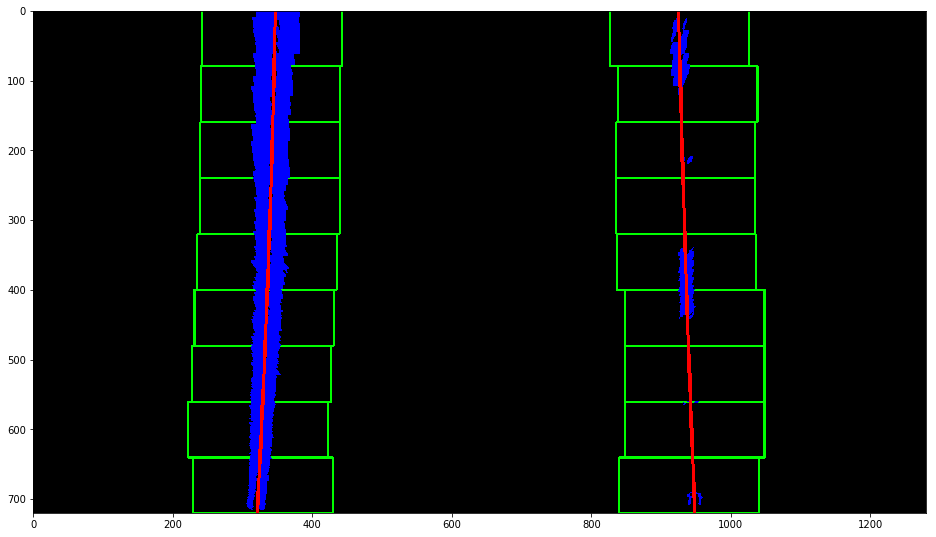

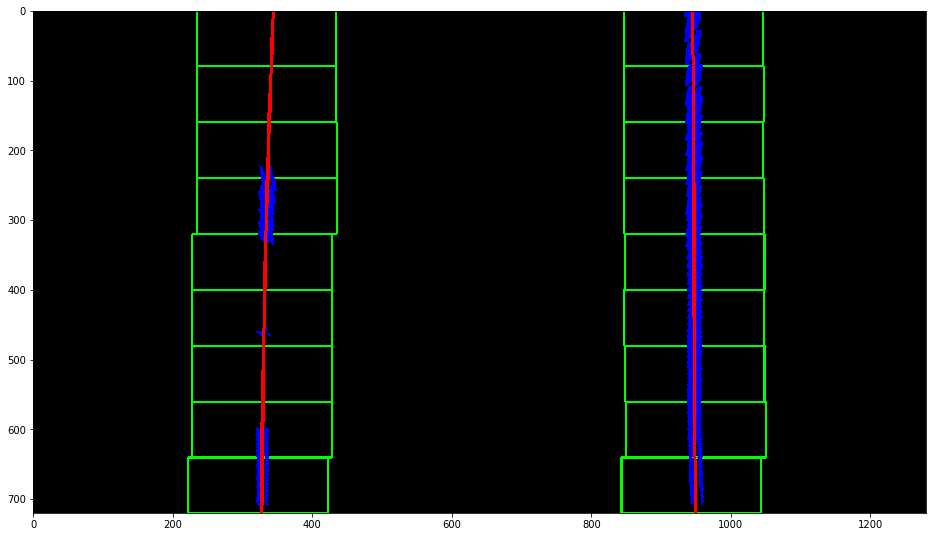

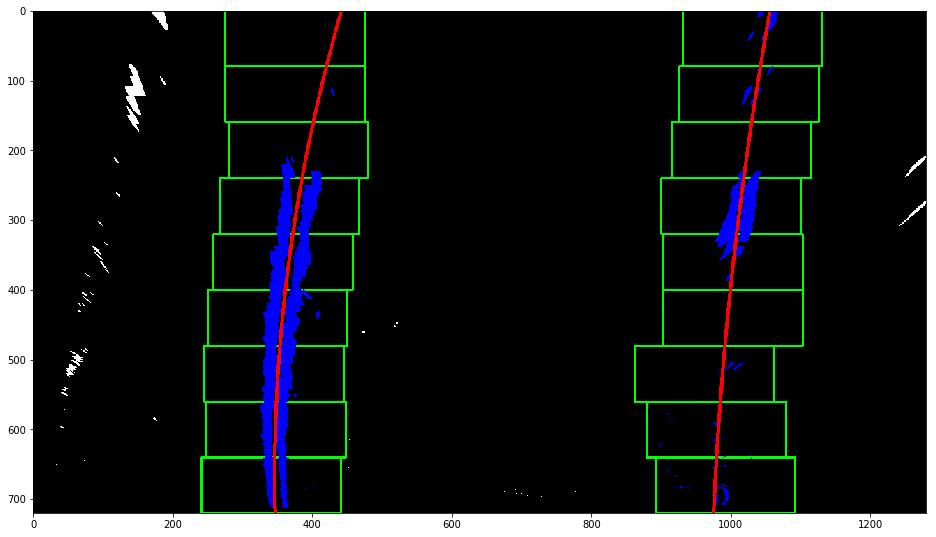

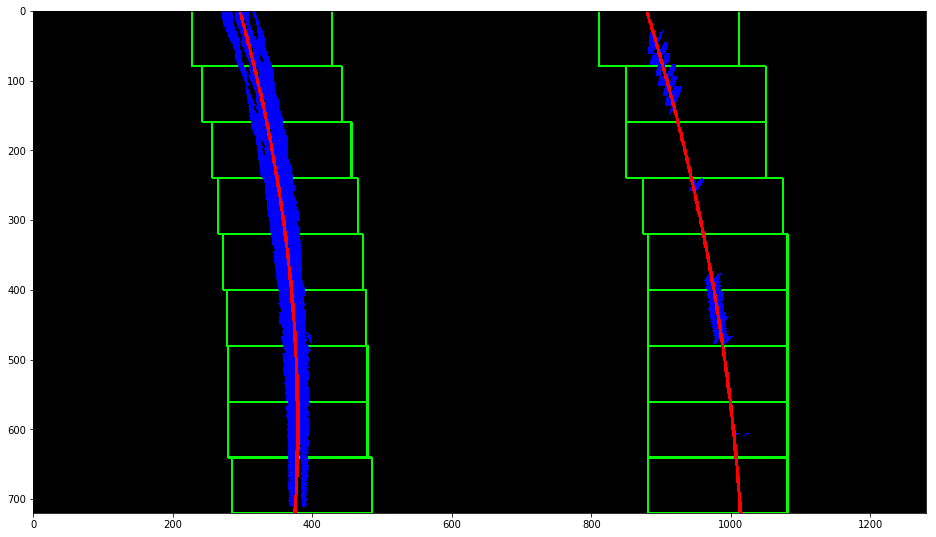

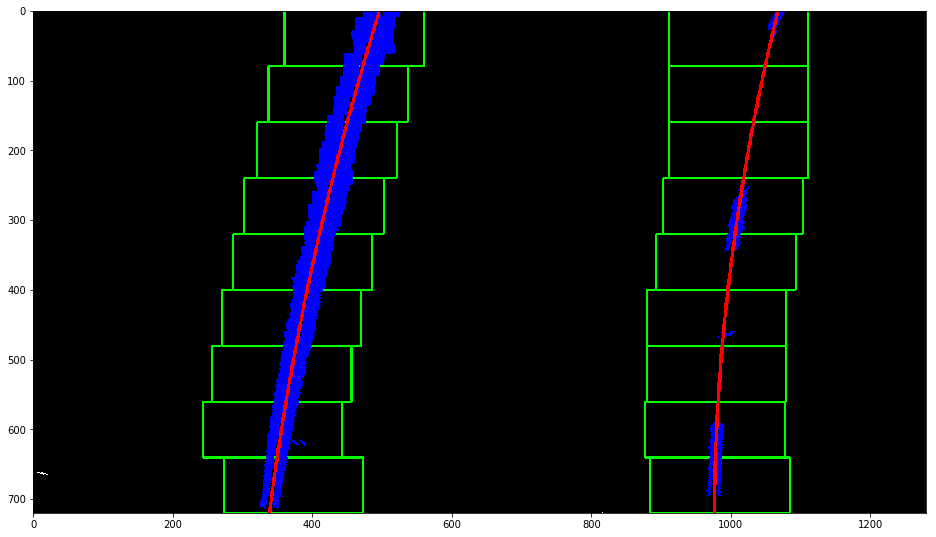

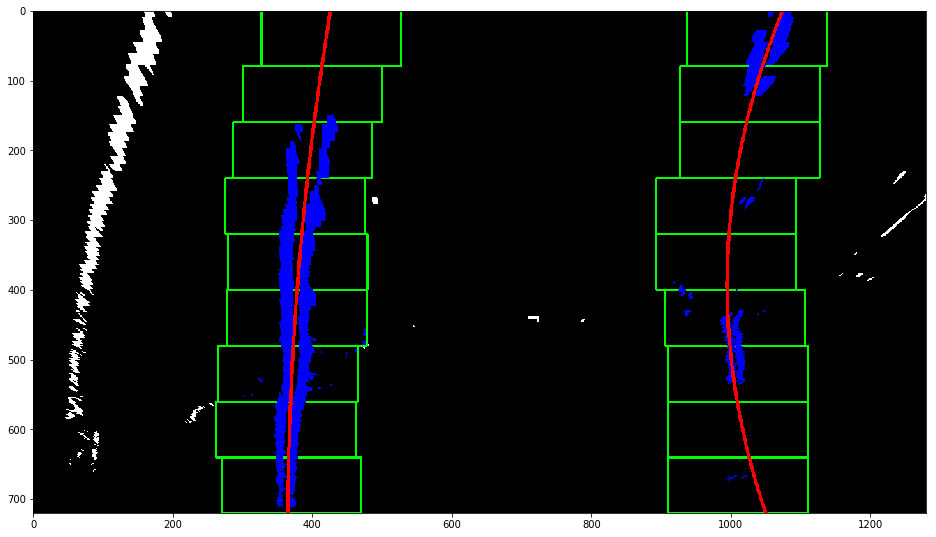

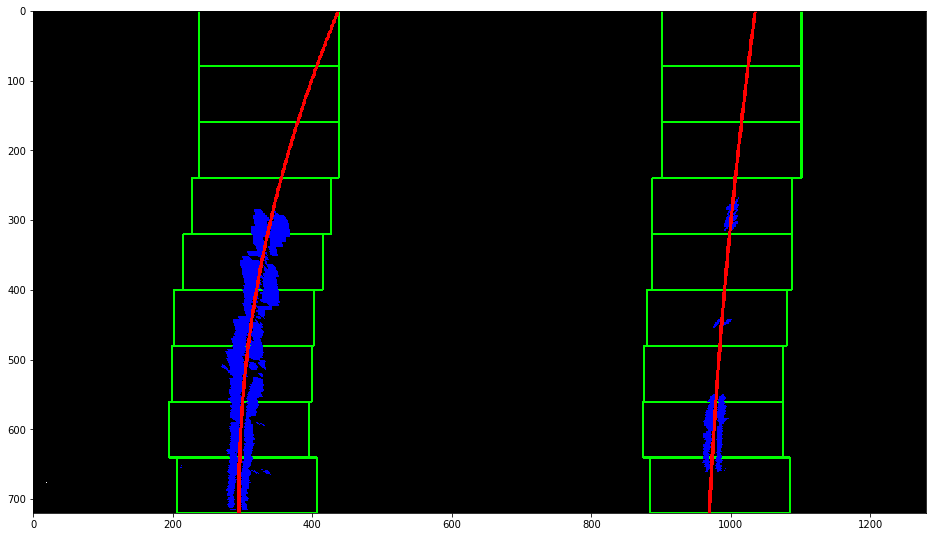

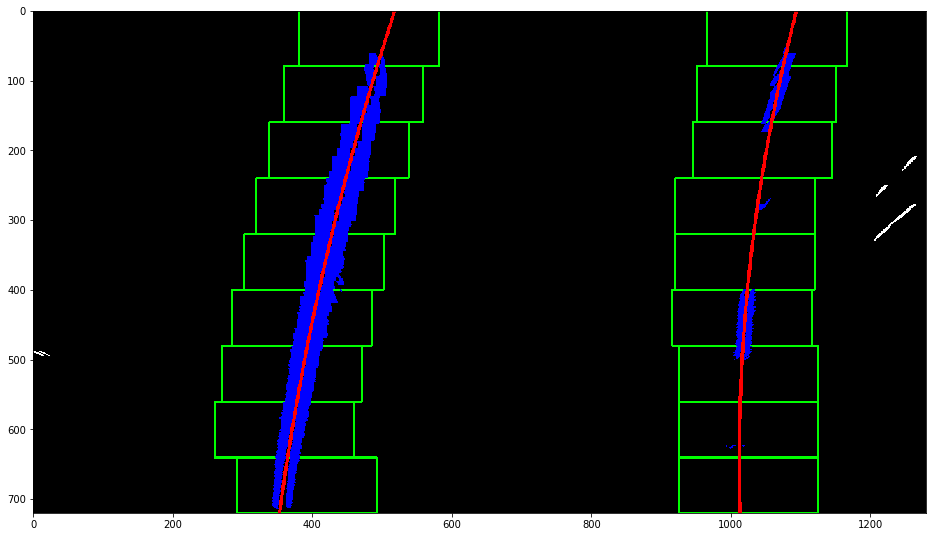

In [44]:
test_images = glob.glob('test_images/*.jpg')
#test_images = glob.glob('test_images/video/*.png')
for fname in sorted(test_images):
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undistorted = undistort(img)
    #thresholded = threshold(undistorted)
    thresholded = threshold2(undistorted, 9)
    binary_warped = warp(thresholded, M)
    
    left_line = Line()
    right_line = Line()
    
    find_line_pixels(binary_warped, left_line, True)
    find_line_pixels(binary_warped, right_line, False)
    fit_polynomial(left_line)
    fit_polynomial(right_line)
    
    # Draw lines
    out_img = draw_lines(binary_warped, left_line, right_line)
    plt.figure(figsize=(16, 12))
    plt.imshow(out_img)
    
    img_name = fname.split('/')[-1].split('.')[0]
    plt.savefig('output_images/' + img_name + '_pixel_searching.png')

## 6. Measuring Curvature and Distance to the Center

In [45]:
# meters per pixel in y dimension
ym_per_pix = 20.0/720
# meters per pixel in x dimension
xm_per_pix = 3.7/640

def calculate_curvature_rad(y_eval, c):
    '''
    Calculates the curvature of polynomial function in meters for given y value.
    '''
    global ym_per_pix, xm_per_pix
    
    # Convert y_eval from pixel to meters
    y_meter = y_eval * ym_per_pix
    # Calculate derivative using polynomials fitted in pixels
    # First order derivative
    dx = 2*c[0]*y_meter*xm_per_pix/ym_per_pix**2 + c[1]*xm_per_pix/ym_per_pix
    # Second order derivative
    dx2 = 2*c[0]*xm_per_pix/ym_per_pix**2
    # Calculation of R_curve (radius of curvature)
    return ((1 + dx**2)**1.5) / np.absolute(dx2)

def calculate_dist_to_center(y_eval, car_center, x_values):
    '''
    Calculates the distance between the car center and bottom of the line in meters.
    '''
    global xm_per_pix
    
    # Calculate x value in pixels for y = y_eval
    x_value = x_values[y_eval]
    # Calculate the distance in meters
    return np.absolute(x_value - car_center)*xm_per_pix

def calculate_line_props(img_shape, line):
    global ploty, ym_per_pix, xm_per_pix
    
    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval = img_shape[0] - 1
    
    line.radius_of_curvature = calculate_curvature_rad(y_eval, line.currentp.c)
    
    car_center = img_shape[1] // 2
    line.line_base_pos = calculate_dist_to_center(y_eval, car_center, line.currentx)
    
    # slope = dx/dy
    c = line.currentp.c
    line.slope = 2*c[0]*(ploty*ym_per_pix)*xm_per_pix/ym_per_pix**2 + c[1]*xm_per_pix/ym_per_pix
    
def print_lines(left_line, right_line):    
    print('Radius: {:6.0f} {:6.0f}'.format(left_line.radius_of_curvature, right_line.radius_of_curvature),
          'Base pos: {:6.2f} {:6.2f}'.format(left_line.line_base_pos, right_line.line_base_pos),
          'Slope: {:6.2f} {:6.2f}'.format(left_line.slope[-1], right_line.slope[-1]))

In [46]:
test_images = glob.glob('test_images/*.jpg')
for fname in test_images:
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undistorted = undistort(img)
    #thresholded = threshold(undistorted)
    thresholded = threshold2(undistorted, 9)
    binary_warped = warp(thresholded, M)
    
    left_line = Line()
    right_line = Line()
    
    find_line_pixels(binary_warped, left_line, True)
    find_line_pixels(binary_warped, right_line, False)
    fit_polynomial(left_line)
    fit_polynomial(right_line)
    
    calculate_line_props(img.shape, left_line)
    calculate_line_props(img.shape, right_line)
    
    # Print calculated measurements
    print(fname)
    print_lines(left_line, right_line)
    print()

test_images/straight_lines1.jpg
Radius:   2923   5197 Base pos:   1.84   1.79 Slope:  -0.01   0.01

test_images/straight_lines2.jpg
Radius:   2650  85219 Base pos:   1.80   1.79 Slope:  -0.00   0.00

test_images/test1.jpg
Radius:    310    720 Base pos:   1.69   1.94 Slope:   0.00  -0.01

test_images/test2.jpg
Radius:    284    394 Base pos:   1.53   2.16 Slope:  -0.01   0.01

test_images/test4.jpg
Radius:    612    130 Base pos:   1.59   2.37 Slope:  -0.00   0.07

test_images/test3.jpg
Radius:    536    409 Base pos:   1.74   1.94 Slope:  -0.03  -0.00

test_images/test5.jpg
Radius:    222   1159 Base pos:   1.99   1.90 Slope:   0.00  -0.01

test_images/test6.jpg
Radius:    512    337 Base pos:   1.66   2.16 Slope:  -0.03   0.01



## 7. Finding Pixels Around Given Polynomial

In [47]:
# Set width of the margin around the previous polynomial to search
margin_around = 100

def search_around_poly(binary_warped, line, last_line):
    global ploty, margin_around

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Set the area of search based on activated x-values
    # within the +/- margin of our best polynomial function
    x_prev = last_line.bestp(nonzeroy)
    lane_inds = ((nonzerox >= (x_prev-margin_around)) & (nonzerox < (x_prev+margin_around))).nonzero()[0]

    # Generate a polygon to illustrate the search window area
    # And recast the x and y points into usable format for cv2.fillPoly()
    line_window1 = np.array([np.transpose(np.vstack([last_line.bestx-margin_around, ploty]))])
    line_window2 = np.array([np.flipud(np.transpose(np.vstack([last_line.bestx+margin_around, ploty])))])
    area = np.hstack((line_window1, line_window2))
    
    # Extract left and right line pixel positions
    line.allx = nonzerox[lane_inds]
    line.ally = nonzeroy[lane_inds]
    line.windows = None
    line.area = area

## 8. Sanity Checking and Tracking Lane

In [48]:
## sanity check hyperparams to control with previously detected one
# maximum curvature rad diff ratio between last and current fit
max_rad_diff_prev = 3
# max slope difference between last and current fit
max_slope_diff_prev = 0.10
# max base position difference between last and current fit
max_pos_diff_prev = 0.20
# max seperation
max_x_diff_prev = 0.5

## sanity check hyperparams to control with each other
# maximum curvature rad diff ratio between left and right fit
max_rad_diff_other = 15
# max slope difference between left and right fit
max_slope_diff_other = 0.16
# max lane width error (in meters)
max_lane_width_error = 1
# max seperation (in meters)
max_x_diff_other = 3

# curvature radius may extreme changes when road is straight
# so we should avoid checking while those situations
rad_threshold = 2000

# max lost frame count
# if last n previous frames are not detected, search lines from scratch
n_frames = 10
# low pass filter parameter to update best fits
low_pass = 0.7

def sanity_check_prev(line, last_line, debug=False):
    global max_rad_diff_prev, max_slope_diff_prev, max_pos_diff_prev, max_x_diff_prev, xm_per_pix
    
    if (last_line is None) or (last_line.nlost_frames >= n_frames):
    #if last_line is None:
        return True
    
    pos_diff = np.absolute(line.line_base_pos - last_line.line_base_pos)
    if pos_diff > max_pos_diff_prev:
        if debug:
            print('Erratic base pos with prev', pos_diff)
        return False
    
    slope_diff = np.max(np.absolute(line.slope - last_line.slope))
    if slope_diff > max_slope_diff_prev:
        if debug:
            print('Erratic slope with prev', slope_diff)
        return False
    
    max_x = np.max(np.absolute(line.currentx - last_line.currentx))*xm_per_pix
    if max_x > max_x_diff_prev:
        if debug:
            print('Erratic seperation with prev', max_x)
        return False
    
    rad_diff = np.absolute((line.radius_of_curvature - last_line.radius_of_curvature) / last_line.radius_of_curvature)
    if (line.radius_of_curvature < rad_threshold) and (last_line.radius_of_curvature < rad_threshold) and (rad_diff > max_rad_diff_prev):
        if debug:
            print('Erratic radius with prev', rad_diff)
        return False
    
    return True

def sanity_check_other(line, other_line, left, debug=False):
    global max_rad_diff_other, max_slope_diff_other, max_lane_width_error, max_x_diff_other, xm_per_pix
    
    if (other_line is None) or (other_line.nlost_frames >= n_frames):
    #if other_line is None:
        return True
    
    if left:
        if not np.logical_and.reduce(line.currentx < other_line.currentx):
            if debug:
                print('All right x must greader than left x')
            return False
    else:
        if not np.logical_and.reduce(line.currentx > other_line.currentx):
            if debug:
                print('All right x must greader than left x')
            return False
    
    lane_width = line.line_base_pos + other_line.line_base_pos
    lane_width_error = np.absolute(lane_width - 3.7) # substract real lane width to zero
    if lane_width_error > max_lane_width_error:
        if debug:
            print('Erratic lane width', lane_width_error)
        return False
    
    slope_diff = np.max(np.absolute(line.slope - other_line.slope))
    if slope_diff > max_slope_diff_other:
        if debug:
            print('Erratic slope with other', slope_diff)
        return False
    
    max_x = np.max(np.absolute(np.absolute(line.currentx - other_line.currentx)*xm_per_pix - 3.7)) # substract real lane width to zero
    if max_x > max_x_diff_other:
        if debug:
            print('Erratic seperation with other', max_x)
        return False
    
    rad_diff = np.absolute((line.radius_of_curvature - other_line.radius_of_curvature) / other_line.radius_of_curvature)
    if (line.radius_of_curvature < rad_threshold) and (other_line.radius_of_curvature < rad_threshold) and (rad_diff > max_rad_diff_other):
        if debug:
            print('Erratic radius with other', rad_diff)
        return False
    
    return True

def update_best(line, last_line):
    global low_pass
    
    if last_line is None:
        line.bestp = line.currentp
        line.bestx = line.currentx
    else:
        line.bestp = last_line.bestp * (1-low_pass) + line.currentp * low_pass
        line.bestx = last_line.bestx * (1-low_pass) + line.currentx * low_pass

def update_last(line, last_line):
    if line.detected:
        return line
    last_line.nlost_frames += 1
    return last_line

def detect_line(binary_warped, last_line, other_line, left, debug=False):
    global n_frames
    
    if debug:
        print('Detecting', 'left' if left else 'right')
    
    line = Line(last_line)
    # Search around the last detected fit
    if (last_line is not None) and (last_line.nlost_frames < n_frames):
        search_around_poly(binary_warped, line, last_line)
    # Find lane pixels from scratch at new start
    else:
        find_line_pixels(binary_warped, line, left)
    fit_polynomial(line)
    calculate_line_props(binary_warped.shape, line)
    line.detected = sanity_check_prev(line, last_line, debug) and sanity_check_other(line, other_line, left, debug)
    if line.detected:
        update_best(line, last_line)
    return line

Detecting left
Detecting right
Radius:   1317   2862 Base pos:   1.82   1.95 Slope:  -0.01   0.01
Detecting left
Detecting right
Radius:   8007    805 Base pos:   1.79   1.91 Slope:  -0.01  -0.01
Detecting left
Detecting right
Radius:   1077   1718 Base pos:   1.75   2.01 Slope:  -0.00   0.02
Detecting left
Detecting right
Radius:  29177    457 Base pos:   1.76   2.01 Slope:  -0.01   0.03
Detecting left
Detecting right
Radius:   2248    149 Base pos:   1.74   2.19 Slope:  -0.00   0.07
Detecting left
Detecting right
Erratic base pos with prev 0.285652807531
Radius:    429   1225 Base pos:   1.82   1.90 Slope:  -0.02  -0.01
Detecting left
Detecting right
Erratic base pos with prev 0.251635229162
Radius:   1443   1951 Base pos:   1.79   1.93 Slope:  -0.01  -0.01
Detecting left
Detecting right
Radius:   1377    564 Base pos:   1.83   2.13 Slope:   0.02  -0.00
Detecting left
Detecting right
Radius:    589    790 Base pos:   1.86   2.10 Slope:  -0.02   0.02
Detecting left
Detecting right
Rad

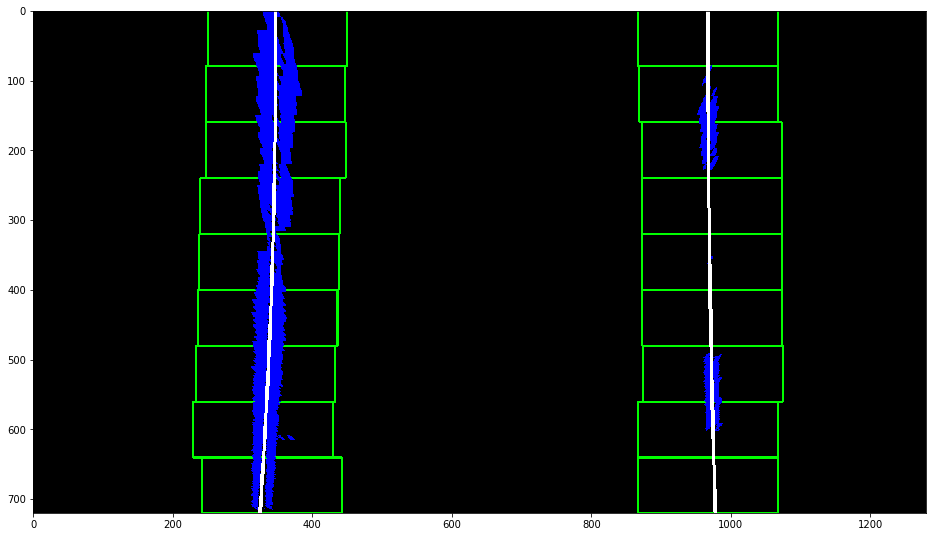

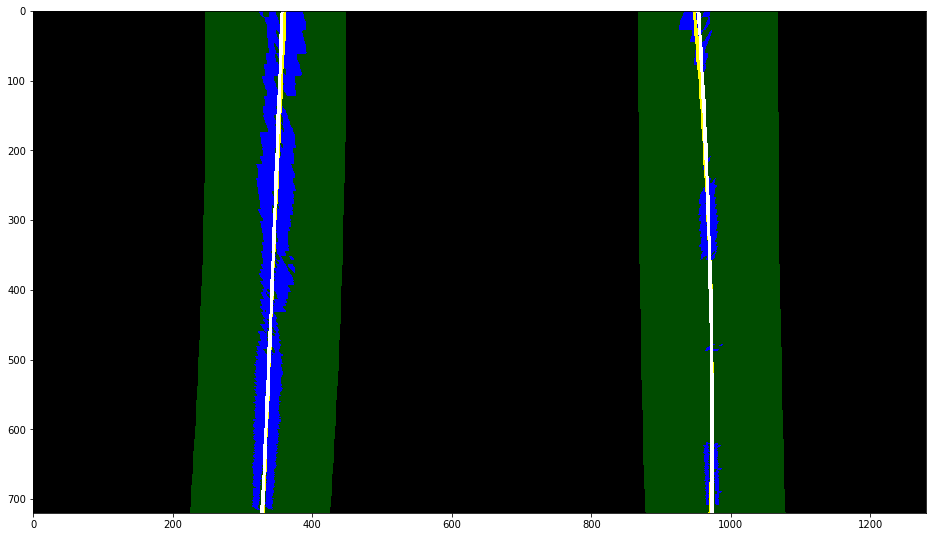

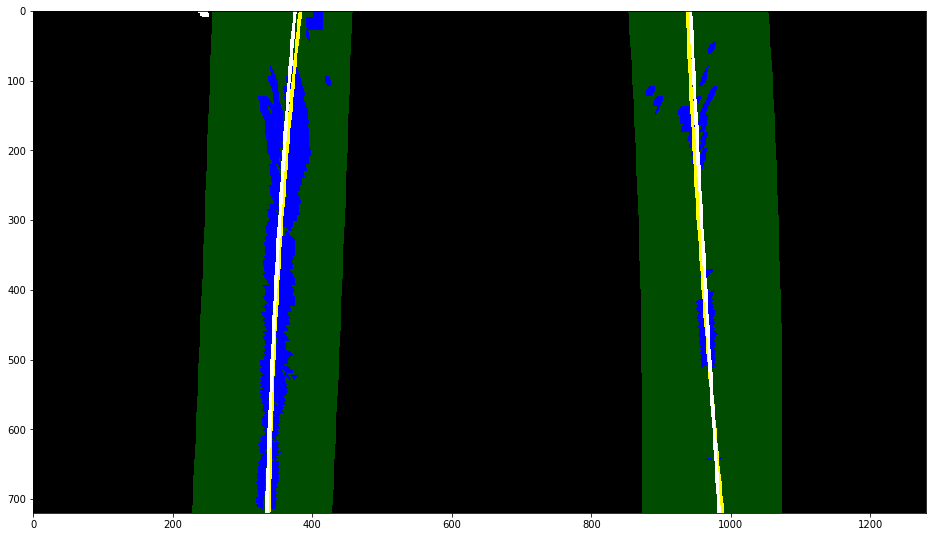

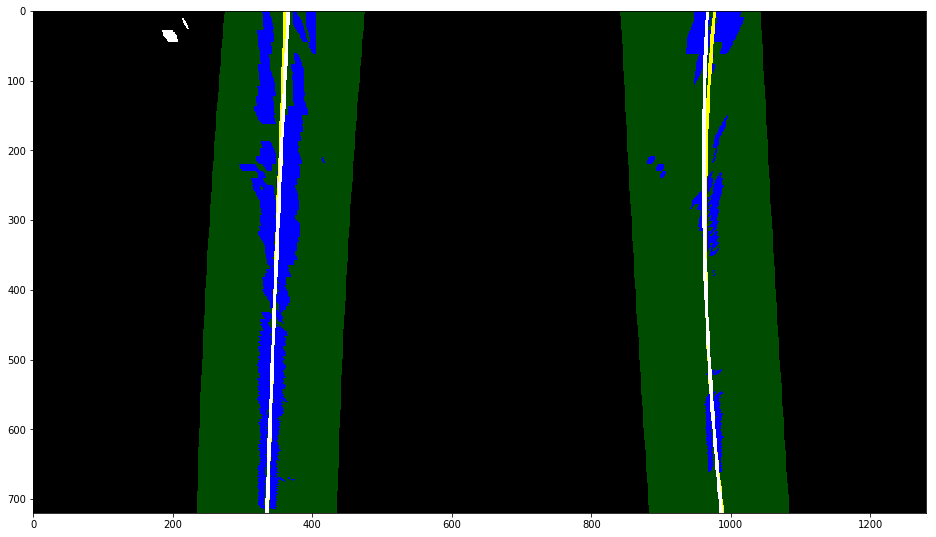

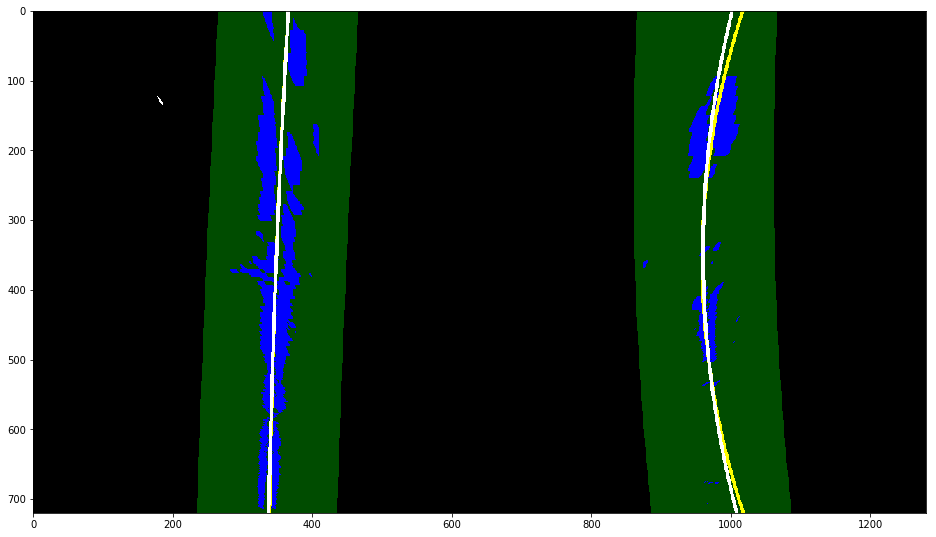

...

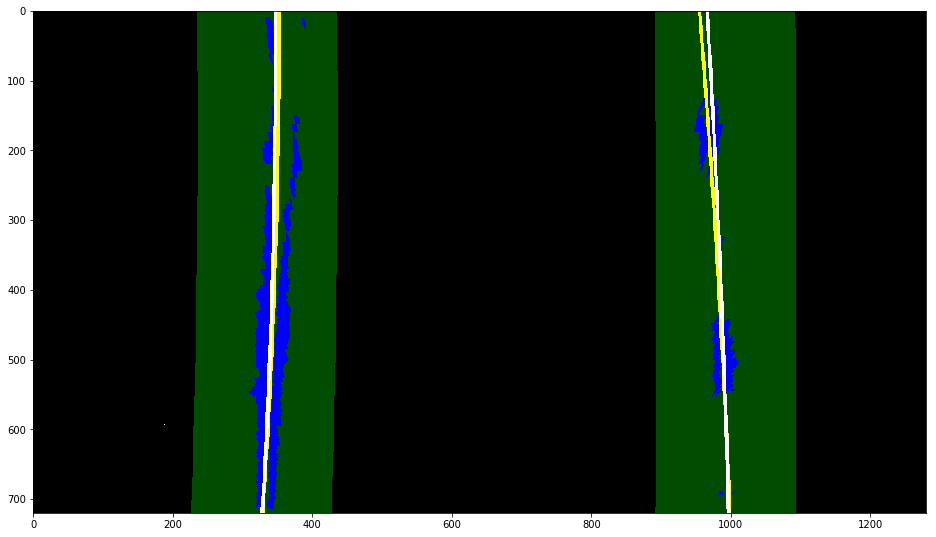

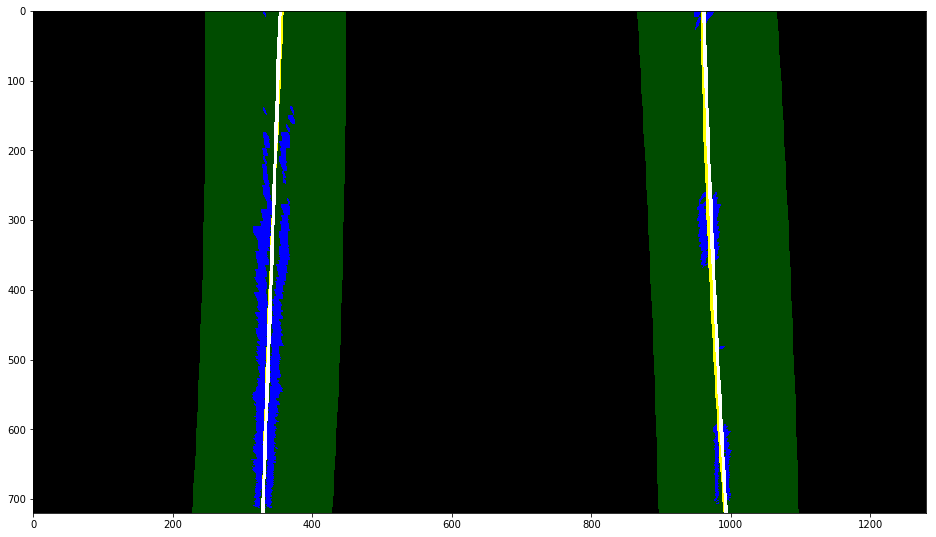

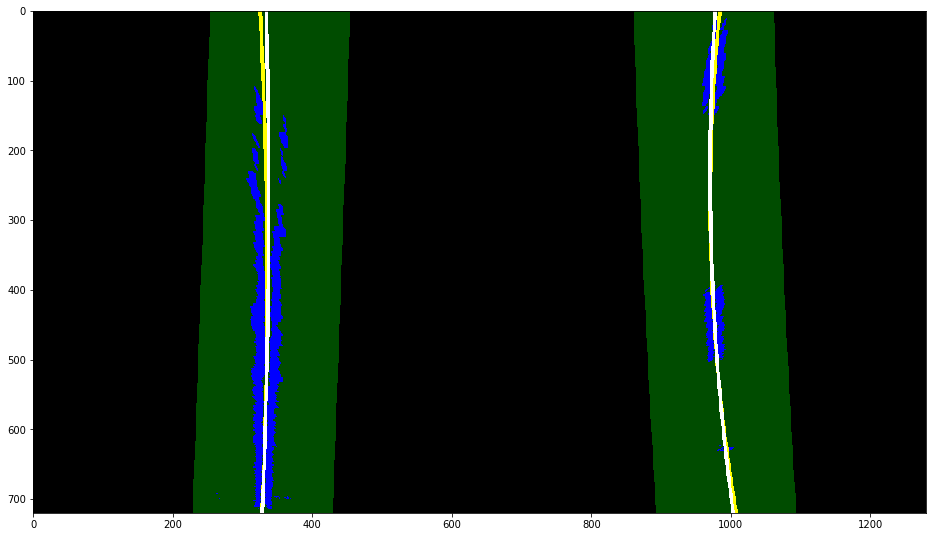

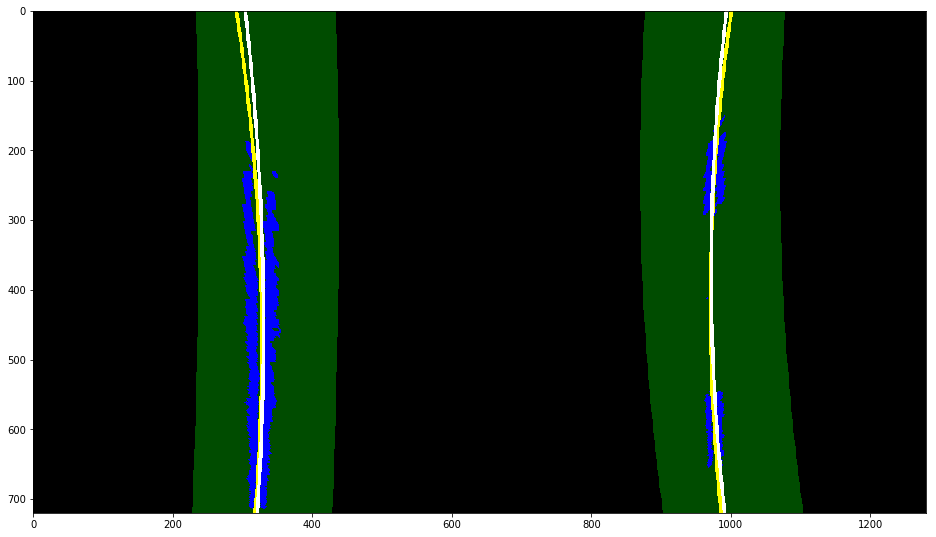

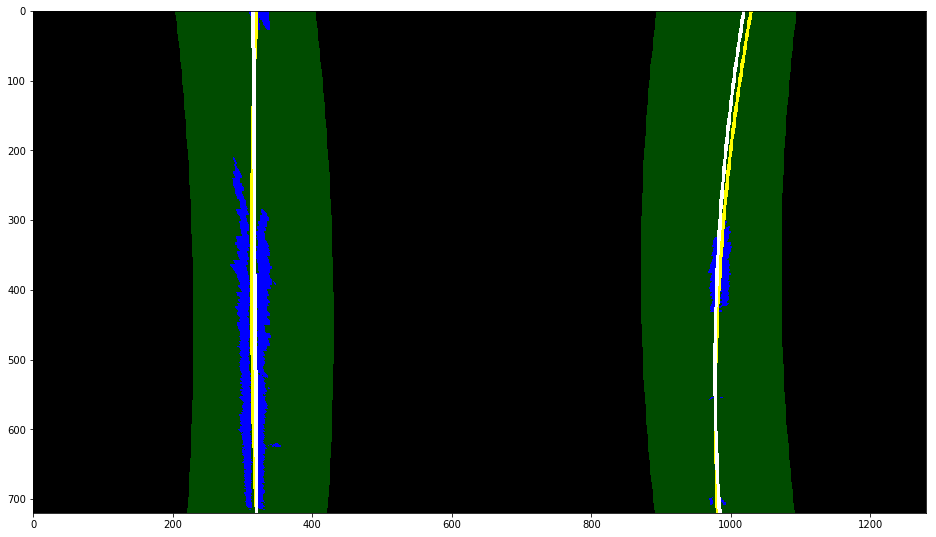

In [49]:
last_left_line = None
last_right_line = None
#test_images = glob.glob('test_images/*.jpg')
test_images = glob.glob('test_images/video/*.png')
for fname in sorted(test_images):
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undistorted = undistort(img)
    #thresholded = threshold(undistorted)
    thresholded = threshold2(undistorted, 9)
    binary_warped = warp(thresholded, M)
    
    left_line = detect_line(binary_warped, last_left_line, last_right_line, True, debug=True)
    right_line = detect_line(binary_warped, last_right_line, last_left_line, False, debug=True)
    print_lines(left_line, right_line)
    
    # Draw lines
    out_img = draw_lines(binary_warped, left_line, right_line)
    plt.figure(figsize=(16, 12))
    plt.imshow(out_img)
    
    img_name = fname.split('/')[-1].split('.')[0]
    plt.savefig('output_images/' + img_name + '_lines.png')
    
    # unless test images are sequencial video frames,
    # comment out to force blind search for each iteration
    last_left_line = update_last(left_line, last_left_line)
    last_right_line = update_last(right_line, last_right_line)

## 9. Warping the Found Lane Back onto the Road

In [50]:
def draw_lane(img, left_line, right_line):
    global Minv, ploty
    
    # Create an image to draw the lines on
    color_warp = np.zeros(img.shape).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_line.bestx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_line.bestx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0, 255, 0))
    
    # Mark the found line points
    color_warp[left_line.ally, left_line.allx] = (255, 0, 0)
    color_warp[right_line.ally, right_line.allx] = (0, 0, 255)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = warp(color_warp, Minv)
    
    # Combine the result with the original image
    result = cv2.addWeighted(img, 1, newwarp, 0.6, 0)
    
    return result

## 10. Putting the Information of Lane onto the Image

In [51]:
def put_text(img, left_line, right_line):
    # Calculate curvature of radius and distance of car to the center of lane
    y_eval = img.shape[0] - 1
    
    left_radius_of_curvature = calculate_curvature_rad(y_eval, left_line.bestp.c)
    right_radius_of_curvature = calculate_curvature_rad(y_eval, right_line.bestp.c)
    
    car_center = img.shape[1] // 2
    left_base_pos = calculate_dist_to_center(y_eval, car_center, left_line.bestx)
    right_base_pos = calculate_dist_to_center(y_eval, car_center, right_line.bestx)
    
    rad_of_curvature = (left_radius_of_curvature + right_radius_of_curvature) / 2
    dist_to_center = (left_base_pos - right_base_pos) / 2
    
    # Format texts to put
    rad_text = 'Radius of Curvature = {:.0f} m'.format(rad_of_curvature)
    direction = 'left' if dist_to_center < 0 else 'right'
    dist_text = 'Vehicle is {:.2f} m {} of center'.format(np.absolute(dist_to_center), direction)
    
    # Put the texts onto the image
    cv2.putText(img, rad_text, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(img, dist_text, (50, 105), cv2.FONT_HERSHEY_SIMPLEX, 2, (255,255,255), 2, cv2.LINE_AA)

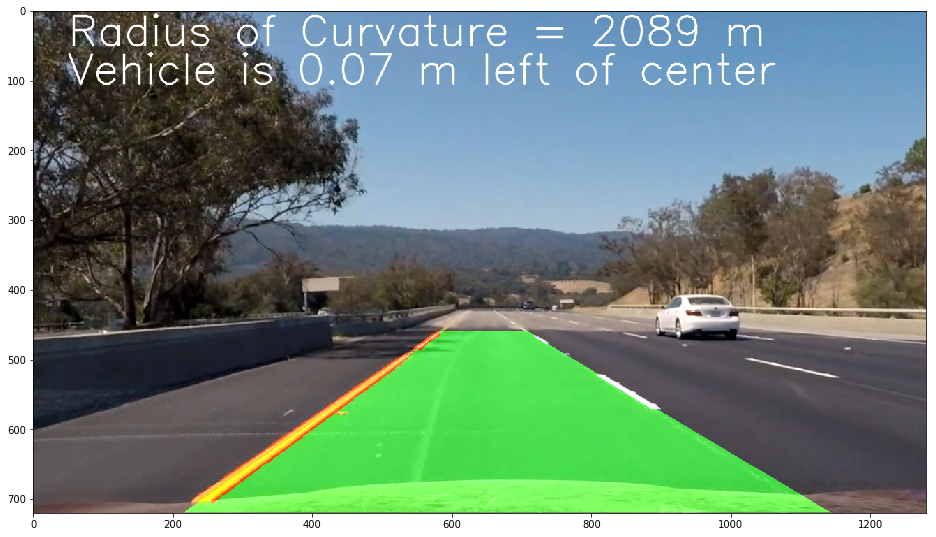

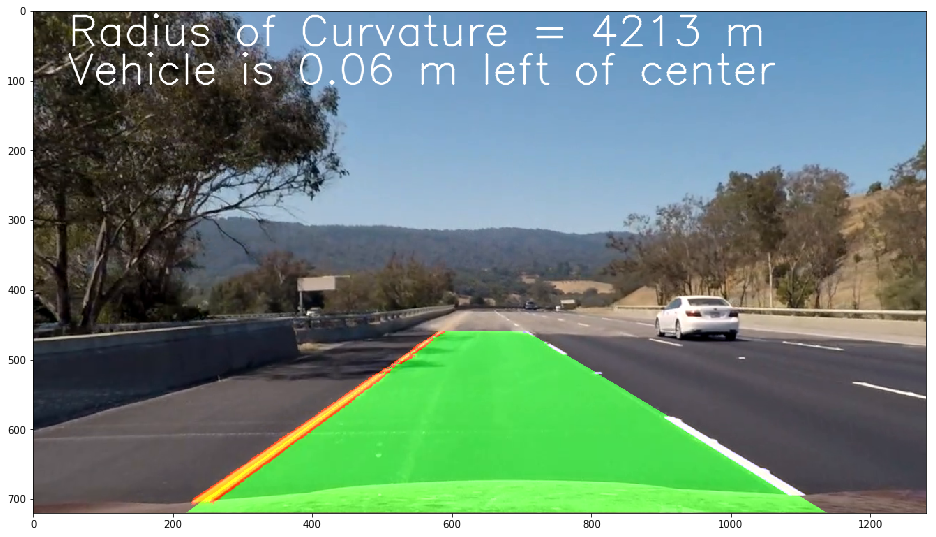

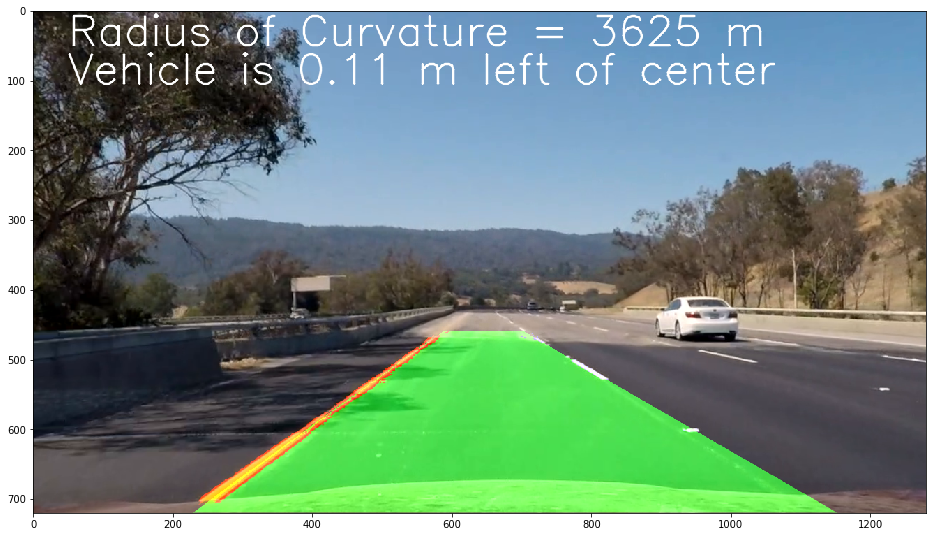

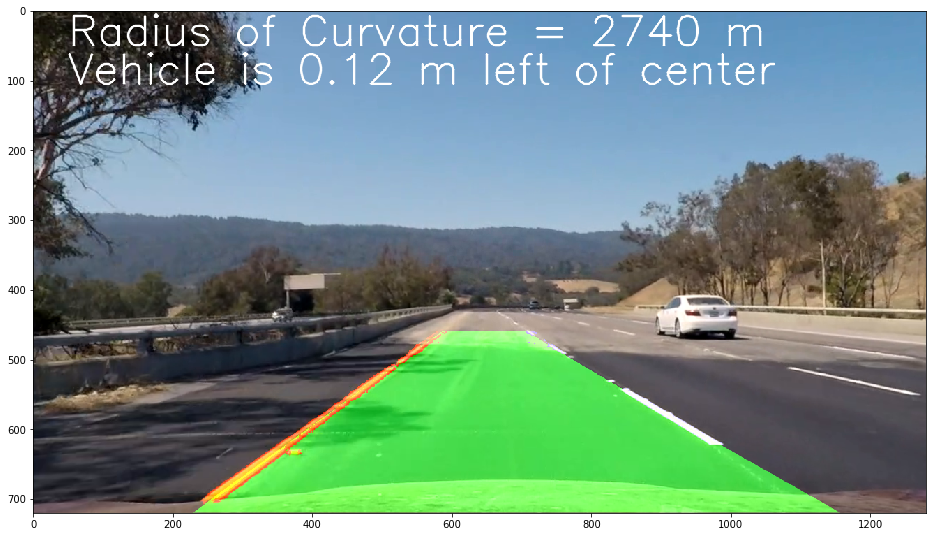

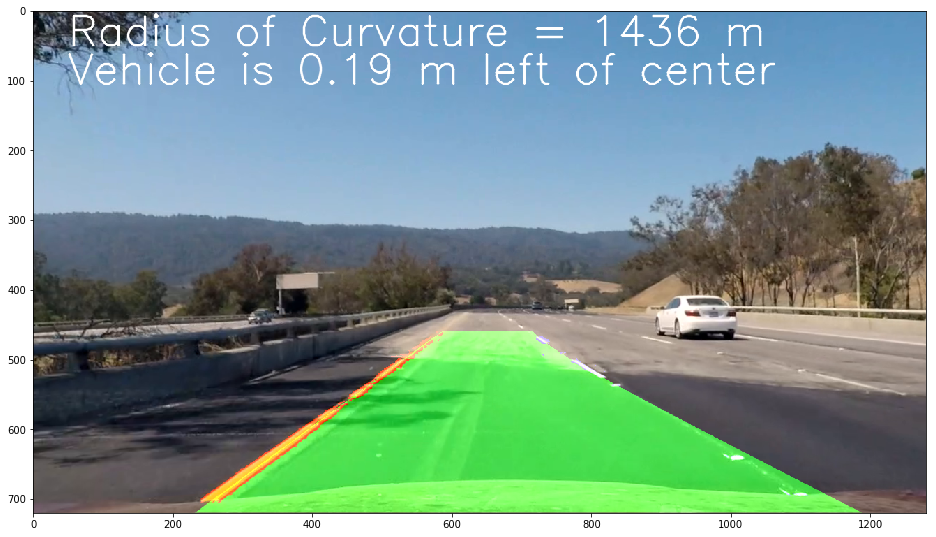

...

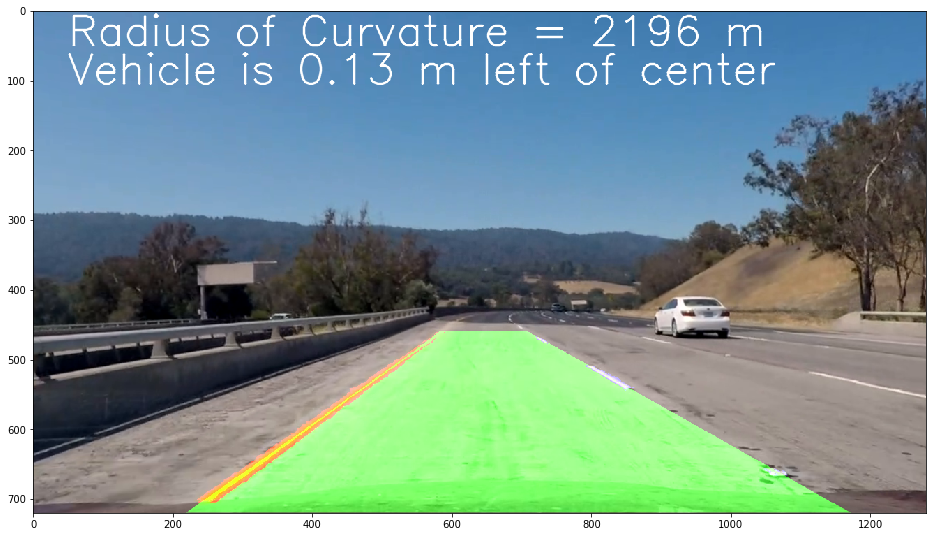

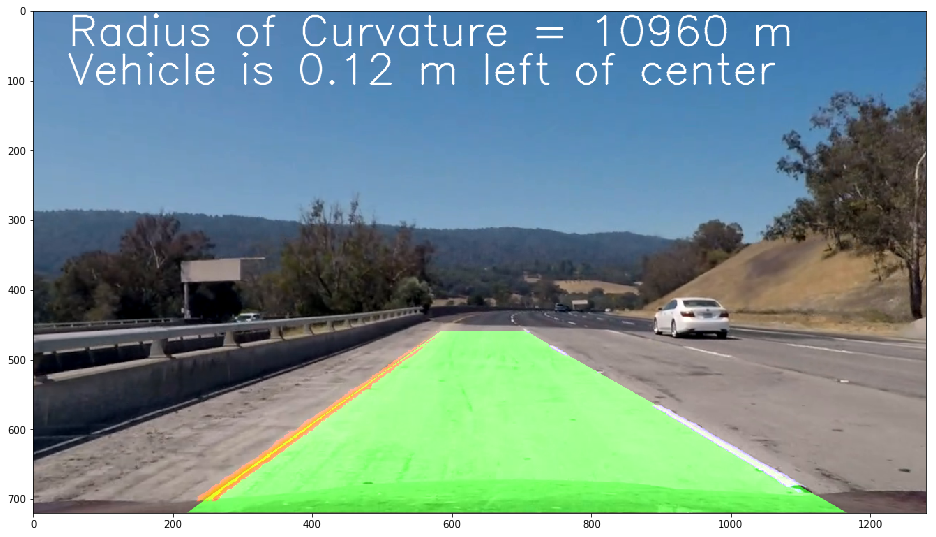

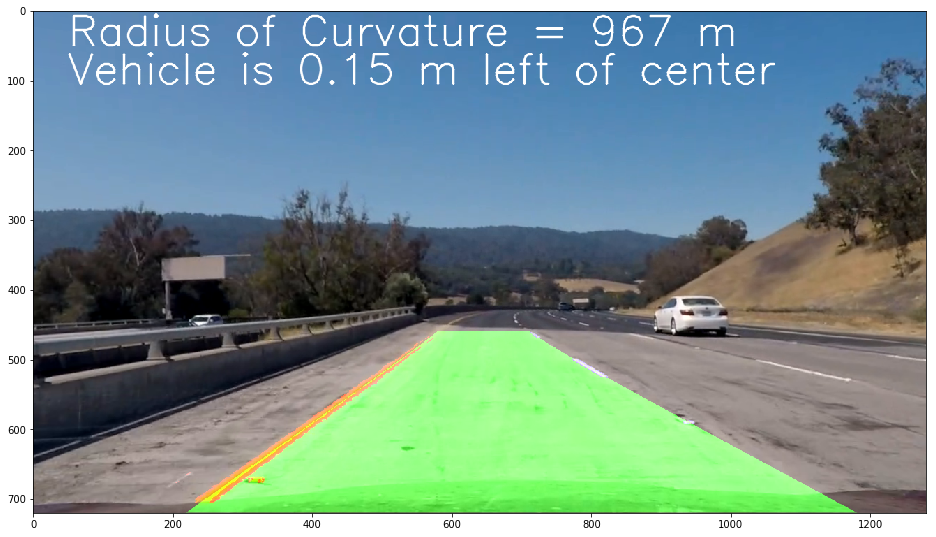

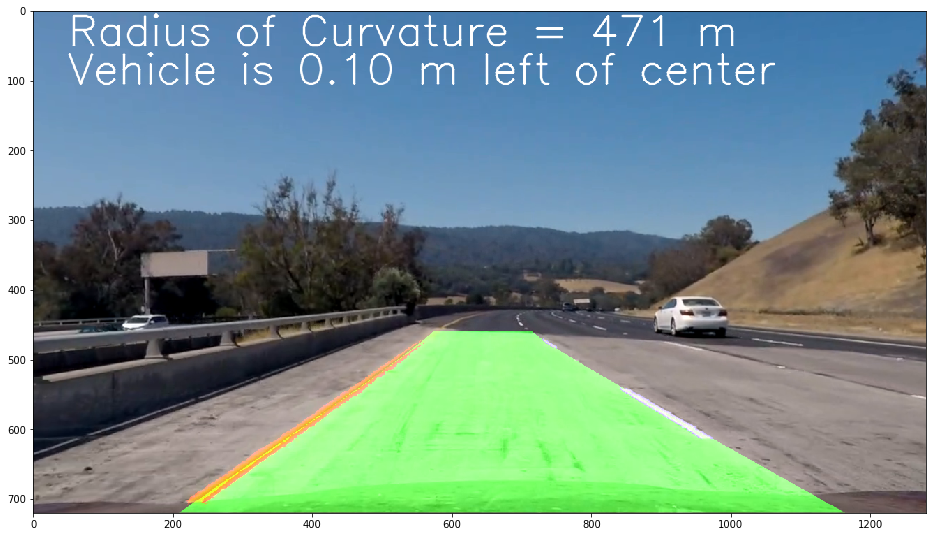

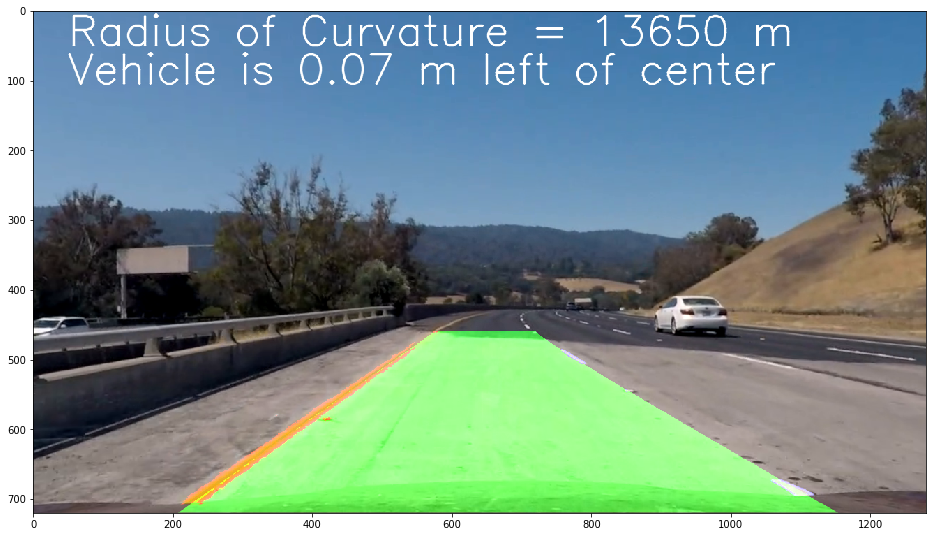

In [52]:
last_left_line = None
last_right_line = None
#test_images = glob.glob('test_images/*.jpg')
test_images = glob.glob('test_images/video/*.png')
for fname in sorted(test_images):
    #img = mpimg.imread(fname)
    img = cv2.cvtColor(cv2.imread(fname), cv2.COLOR_BGR2RGB)
    undistorted = undistort(img)
    #thresholded = threshold(undistorted)
    thresholded = threshold2(undistorted, 9)
    binary_warped = warp(thresholded, M)
    
    left_line = detect_line(binary_warped, last_left_line, last_right_line, True)
    right_line = detect_line(binary_warped, last_right_line, last_left_line, False)
    
    # Draw the lane with found line points
    result = draw_lane(undistorted, left_line, right_line)
    # Put the calculated informations onto the image
    put_text(result, left_line, right_line)
    
    plt.figure(figsize=(16, 12))
    plt.imshow(result)
    
    img_name = fname.split('/')[-1].split('.')[0]
    plt.savefig('output_images/' + img_name + '_warpedback.png')
    
    # unless test images are sequencial video frames,
    # comment out to force blind search for each iteration
    last_left_line = update_last(left_line, last_left_line)
    last_right_line = update_last(right_line, last_right_line)

## 11. Video Processing Pipeline

In [53]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [54]:
import matplotlib.image as mpimg

# Create a video processing pipeline
def process_image(img):
    global last_left_line, last_right_line
    
    undistorted = undistort(img)
    #thresholded = threshold(undistorted)
    thresholded = threshold2(undistorted, 9)
    # Test thresholding
    #return np.dstack((thresholded, thresholded, thresholded)) * 255.0
    binary_warped = warp(thresholded, M)
    
    left_line = detect_line(binary_warped, last_left_line, last_right_line, True)
    right_line = detect_line(binary_warped, last_right_line, last_left_line, False)
    
    # print line infos to gain insight into estimating sanity thresholds
    #print_lines(y_bottom, left_line, right_line)
    # Test line detection
    #result = draw_lines(binary_warped, left_line, right_line)
    # Draw the lane with found line points
    result = draw_lane(undistorted, left_line, right_line)
    # Put the calculated informations onto the image
    put_text(result, left_line, right_line)
    
    last_left_line = update_last(left_line, last_left_line)
    last_right_line = update_last(right_line, last_right_line)
    
    return result

video_index = 0
video_name = 'video'
def extract_image(img):
    global video_index
    if video_index % 5 == 0:
        mpimg.imsave('test_images/{}_{:04d}.png'.format(video_name, video_index//5), img)
    video_index += 1
    return process_image(img)

In [55]:
last_left_line = None
last_right_line = None
#clip1 = VideoFileClip("project_video.mp4").subclip(20, 26)
clip1 = VideoFileClip("project_video.mp4")
clip1_output = clip1.fl_image(process_image)
#video_index = 0
#clip1_output = clip1.fl_image(extract_image)
video1_output = 'project_video_output.mp4'
#video1_output = 'project_video_warped.mp4'
%time clip1_output.write_videofile(video1_output, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4



 12%|█▏        | 152/1261 [00:55<06:52,  2.69it/s]


 24%|██▍       | 303/1261 [01:52<05:58,  2.67it/s]


 36%|███▌      | 454/1261 [02:50<05:06,  2.63it/s]


 48%|████▊     | 605/1261 [03:49<04:29,  2.43it/s]


 60%|█████▉    | 756/1261 [04:48<03:13,  2.60it/s]


 72%|███████▏  | 907/1261 [05:46<02:16,  2.60it/s]


 84%|████████▍ | 1057/1261 [06:45<01:26,  2.37it/s]


 96%|█████████▌| 1205/1261 [07:43<00:21,  2.65it/s]


100%|█████████▉| 1260/1261 [08:04<00:00,  2.68it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 10s, sys: 46 s, total: 5min 56s
Wall time: 8min 7s


In [56]:
last_left_line = None
last_right_line = None
#clip2 = VideoFileClip("challenge_video.mp4").subclip(5, 7)
clip2 = VideoFileClip("challenge_video.mp4")
clip2_output = clip2.fl_image(process_image)
#video_index = 0
#clip2_output = clip2.fl_image(extract_image)
video2_output = 'challenge_video_output.mp4'
#video2_output = 'challenge_video_warped.mp4'
%time clip2_output.write_videofile(video2_output, audio=False)

[MoviePy] >>>> Building video challenge_video_output.mp4
[MoviePy] Writing video challenge_video_output.mp4



 28%|██▊       | 134/485 [00:46<02:07,  2.76it/s]

The function failed to fit a line!



 28%|██▊       | 135/485 [00:47<02:09,  2.71it/s]

The function failed to fit a line!



 28%|██▊       | 136/485 [00:47<02:05,  2.78it/s]

The function failed to fit a line!



 28%|██▊       | 137/485 [00:48<02:09,  2.69it/s]

The function failed to fit a line!



 28%|██▊       | 138/485 [00:48<02:06,  2.75it/s]

The function failed to fit a line!



 29%|██▊       | 139/485 [00:48<02:08,  2.69it/s]

The function failed to fit a line!



 29%|██▉       | 140/485 [00:49<02:06,  2.72it/s]

The function failed to fit a line!



 61%|██████    | 294/485 [01:48<01:10,  2.72it/s]


 92%|█████████▏| 448/485 [02:45<00:14,  2.63it/s]


100%|██████████| 485/485 [02:59<00:00,  2.74it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_output.mp4 

CPU times: user 1min 56s, sys: 17.1 s, total: 2min 14s
Wall time: 3min 2s


In [57]:
last_left_line = None
last_right_line = None
#clip3 = VideoFileClip("harder_challenge_video.mp4").subclip(20, 26)
clip3 = VideoFileClip("harder_challenge_video.mp4")
clip3_output = clip3.fl_image(process_image)
#video_index = 0
#clip3_output = clip3.fl_image(extract_image)
video3_output = 'harder_challenge_video_output.mp4'
#video3_output = 'harder_challenge_video_warped.mp4'
%time clip3_output.write_videofile(video3_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_output.mp4
[MoviePy] Writing video harder_challenge_video_output.mp4



 13%|█▎        | 152/1200 [01:00<07:25,  2.35it/s]


 25%|██▌       | 303/1200 [02:06<06:23,  2.34it/s]


 38%|███▊      | 454/1200 [03:14<05:33,  2.24it/s]


 50%|█████     | 601/1200 [04:14<03:54,  2.55it/s]

The function failed to fit a line!
The function failed to fit a line!



 50%|█████     | 602/1200 [04:14<03:52,  2.57it/s]

The function failed to fit a line!
The function failed to fit a line!



 50%|█████     | 603/1200 [04:15<03:55,  2.54it/s]

The function failed to fit a line!
The function failed to fit a line!



 50%|█████     | 604/1200 [04:15<03:50,  2.59it/s]

The function failed to fit a line!
The function failed to fit a line!



 50%|█████     | 606/1200 [04:16<03:47,  2.62it/s]

The function failed to fit a line!



 51%|█████     | 607/1200 [04:16<03:53,  2.54it/s]

The function failed to fit a line!



 51%|█████     | 609/1200 [04:17<03:53,  2.53it/s]

The function failed to fit a line!



 51%|█████     | 610/1200 [04:18<03:48,  2.59it/s]

The function failed to fit a line!



 51%|█████     | 611/1200 [04:18<03:53,  2.52it/s]

The function failed to fit a line!



 51%|█████     | 612/1200 [04:18<03:48,  2.57it/s]

The function failed to fit a line!



 51%|█████     | 613/1200 [04:19<03:58,  2.47it/s]

The function failed to fit a line!



 64%|██████▎   | 764/1200 [05:24<03:09,  2.30it/s]


 76%|███████▋  | 915/1200 [06:30<02:13,  2.14it/s]


 77%|███████▋  | 922/1200 [06:33<02:01,  2.29it/s]

The function failed to fit a line!



 77%|███████▋  | 923/1200 [06:33<02:01,  2.29it/s]

The function failed to fit a line!



 77%|███████▋  | 924/1200 [06:34<01:59,  2.30it/s]

The function failed to fit a line!



 77%|███████▋  | 925/1200 [06:34<01:58,  2.31it/s]

The function failed to fit a line!



 77%|███████▋  | 926/1200 [06:35<01:59,  2.29it/s]

The function failed to fit a line!



 77%|███████▋  | 927/1200 [06:35<01:56,  2.33it/s]

The function failed to fit a line!



 77%|███████▋  | 928/1200 [06:35<01:55,  2.36it/s]

The function failed to fit a line!



 77%|███████▋  | 929/1200 [06:36<01:54,  2.37it/s]

The function failed to fit a line!



 78%|███████▊  | 930/1200 [06:36<01:57,  2.30it/s]

The function failed to fit a line!



 78%|███████▊  | 931/1200 [06:37<02:00,  2.24it/s]

The function failed to fit a line!



 78%|███████▊  | 932/1200 [06:37<01:54,  2.33it/s]

The function failed to fit a line!



 78%|███████▊  | 933/1200 [06:37<01:51,  2.39it/s]

The function failed to fit a line!



 78%|███████▊  | 934/1200 [06:38<01:55,  2.30it/s]

The function failed to fit a line!



 78%|███████▊  | 935/1200 [06:38<01:53,  2.34it/s]

The function failed to fit a line!



 78%|███████▊  | 936/1200 [06:39<01:51,  2.36it/s]

The function failed to fit a line!



 78%|███████▊  | 938/1200 [06:40<01:50,  2.36it/s]

The function failed to fit a line!



 78%|███████▊  | 939/1200 [06:40<01:51,  2.35it/s]

The function failed to fit a line!



 78%|███████▊  | 940/1200 [06:40<01:48,  2.39it/s]

The function failed to fit a line!



 78%|███████▊  | 941/1200 [06:41<01:48,  2.38it/s]

The function failed to fit a line!



 78%|███████▊  | 942/1200 [06:41<01:50,  2.34it/s]

The function failed to fit a line!



 79%|███████▊  | 943/1200 [06:42<01:52,  2.28it/s]

The function failed to fit a line!



 79%|███████▊  | 944/1200 [06:42<01:51,  2.30it/s]

The function failed to fit a line!



 79%|███████▉  | 945/1200 [06:43<01:45,  2.41it/s]

The function failed to fit a line!



 79%|███████▉  | 946/1200 [06:43<01:45,  2.42it/s]

The function failed to fit a line!



 79%|███████▉  | 947/1200 [06:43<01:44,  2.41it/s]

The function failed to fit a line!



 79%|███████▉  | 949/1200 [06:44<01:43,  2.43it/s]

The function failed to fit a line!



 79%|███████▉  | 950/1200 [06:45<01:42,  2.43it/s]

The function failed to fit a line!



 79%|███████▉  | 951/1200 [06:45<01:43,  2.41it/s]

The function failed to fit a line!



 79%|███████▉  | 952/1200 [06:46<01:43,  2.39it/s]

The function failed to fit a line!



 79%|███████▉  | 953/1200 [06:46<01:42,  2.42it/s]

The function failed to fit a line!



 80%|███████▉  | 954/1200 [06:46<01:41,  2.42it/s]

The function failed to fit a line!



 80%|███████▉  | 955/1200 [06:47<01:40,  2.43it/s]

The function failed to fit a line!



 80%|███████▉  | 956/1200 [06:47<01:37,  2.51it/s]

The function failed to fit a line!



 80%|███████▉  | 957/1200 [06:48<01:37,  2.48it/s]

The function failed to fit a line!



 80%|███████▉  | 958/1200 [06:48<01:34,  2.56it/s]

The function failed to fit a line!



 80%|████████  | 962/1200 [06:49<01:30,  2.62it/s]

The function failed to fit a line!



 80%|████████  | 963/1200 [06:50<01:29,  2.64it/s]

The function failed to fit a line!



 80%|████████  | 964/1200 [06:50<01:34,  2.49it/s]

The function failed to fit a line!



 80%|████████  | 965/1200 [06:51<01:38,  2.39it/s]

The function failed to fit a line!



 80%|████████  | 966/1200 [06:51<01:39,  2.36it/s]

The function failed to fit a line!



 81%|████████  | 967/1200 [06:52<01:35,  2.45it/s]

The function failed to fit a line!



 81%|████████  | 968/1200 [06:52<01:36,  2.39it/s]

The function failed to fit a line!



 81%|████████  | 969/1200 [06:52<01:39,  2.33it/s]

The function failed to fit a line!



 81%|████████  | 971/1200 [06:53<01:37,  2.34it/s]

The function failed to fit a line!



 81%|████████  | 972/1200 [06:54<01:38,  2.31it/s]

The function failed to fit a line!



 81%|████████  | 973/1200 [06:54<01:37,  2.32it/s]

The function failed to fit a line!



 81%|████████  | 974/1200 [06:55<01:34,  2.39it/s]

The function failed to fit a line!



 81%|████████▏ | 975/1200 [06:55<01:33,  2.40it/s]

The function failed to fit a line!



 81%|████████▏ | 976/1200 [06:55<01:29,  2.50it/s]

The function failed to fit a line!



 81%|████████▏ | 977/1200 [06:56<01:31,  2.43it/s]

The function failed to fit a line!



 82%|████████▏ | 978/1200 [06:56<01:36,  2.31it/s]

The function failed to fit a line!



 82%|████████▏ | 979/1200 [06:57<01:34,  2.33it/s]

The function failed to fit a line!



 82%|████████▏ | 980/1200 [06:57<01:30,  2.43it/s]

The function failed to fit a line!



 83%|████████▎ | 993/1200 [07:02<01:25,  2.41it/s]

The function failed to fit a line!



 83%|████████▎ | 994/1200 [07:03<01:22,  2.49it/s]

The function failed to fit a line!



 83%|████████▎ | 995/1200 [07:03<01:24,  2.43it/s]

The function failed to fit a line!



 83%|████████▎ | 996/1200 [07:04<01:21,  2.51it/s]

The function failed to fit a line!



 83%|████████▎ | 997/1200 [07:04<01:22,  2.45it/s]

The function failed to fit a line!



 83%|████████▎ | 999/1200 [07:05<01:22,  2.43it/s]

The function failed to fit a line!



 83%|████████▎ | 1000/1200 [07:05<01:20,  2.48it/s]

The function failed to fit a line!



 85%|████████▍ | 1019/1200 [07:13<01:12,  2.49it/s]

The function failed to fit a line!



 85%|████████▌ | 1020/1200 [07:13<01:10,  2.55it/s]

The function failed to fit a line!



 97%|█████████▋| 1168/1200 [08:16<00:14,  2.17it/s]


100%|█████████▉| 1199/1200 [08:29<00:00,  2.39it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_output.mp4 

CPU times: user 5min 3s, sys: 42.5 s, total: 5min 46s
Wall time: 8min 33s
